# Track Momentum Reconstruction

In this tutorial, we introduce track momentum (energy) reconstruction with CSDA range-based energy tables and ADC pixel depositions.

Let's first setup environments:

In [1]:
import sys, os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

SOFTWARE_DIR = '/sdf/group/neutrino/koh0207/spine/' # Change this path to your software install
DATA_DIR = '/sdf/data/neutrino/icarus/spine/prod/mpvmpr_v02/output_spine/' # Change this path if you are not on SDF (see main README)

# Visualization Tools
import plotly
import plotly.graph_objs as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

# Set software directory
sys.path.append(SOFTWARE_DIR)

Now load the analysis configuration and dump it to see its content

In [2]:
import yaml

DATA_PATH = DATA_DIR + 'test_00_spine.h5' # Replace the source file with the correct path
anaconfig = './config/spine.cfg'
anaconfig = yaml.safe_load(open(anaconfig, 'r').read().replace('DATA_PATH', DATA_PATH))

print(yaml.dump(anaconfig))

build:
  fragments: false
  interactions: true
  mode: both
  particles: true
  units: cm
io:
  reader:
    file_keys: /sdf/data/neutrino/icarus/spine/prod/mpvmpr_v02/output_spine/test_00_spine.h5
    name: hdf5



Now initialize the driver with this configuration

In [3]:
from spine.driver import Driver

driver = Driver(anaconfig)

Welcome to JupyROOT 6.22/08

 ██████████   ██████████    ███   ███       ██   ███████████
███        █  ██       ███   █    █████     ██   ██         
  ████████    ██       ███  ███   ██  ████  ██   ██████████ 
█        ███  ██████████     █    ██     █████   ██         
 ██████████   ██            ███   ██       ███   ███████████

Release version: 0.1.0

$CUDA_VISIBLE_DEVICES=

Configuration processed at: Linux sdfampere038 4.18.0-372.32.1.el8_6.x86_64 #1 SMP Fri Oct 7 12:35:10 EDT 2022 x86_64 x86_64 x86_64 GNU/Linux

base: {seed: 1721809767}
io:
  reader: {name: hdf5, file_keys: /sdf/data/neutrino/icarus/spine/prod/mpvmpr_v02/output_spine/test_00_spine.h5}
build: {mode: both, units: cm, fragments: false, particles: true, interactions: true}

Will load 1 file(s):
  - /sdf/data/neutrino/icarus/spine/prod/mpvmpr_v02/output_spine/test_00_spine.h5

Total number of entries in the file(s): 112

Total number of entries selected: 112



## 1. Introduction

For track (muon/pion/proton) energy reconstruction, two methods are in general use: *range-based (CSDA) energy reconstruction* and *multiple-coulomb scattering (MCS)*. In this tutorial, we will mostly consider *range-based energy reconstruction*. 

### 1-1. Range-based Energy Reconstruction

Recll that the stopping power $S(E)$ of a particle usually refers to the energy loss rate 𝑑𝐸/𝑑𝑥 when it passes through matter. When charged particles (such as a muon) travel through our LArTPC detector, they interact with the argon and lose energy:

$$ S(E) = - \frac{dE}{dx}.$$

The mean range, or the *continuous slowing down approximation (CSDA)* range $\Delta x$ can be computed as:

$$\Delta x = \int_0^{E_0} \frac{1}{S(E)} \ dE,$$

where $E_0$ is the initial kinetic energy of the muon. In practice, this integral is computed for a range of $E_0$ values and saved as a [table](https://pdg.lbl.gov/2012/AtomicNuclearProperties/MUON_ELOSS_TABLES/muonloss_289.pdf). The energy of the muon could then be reconstructed from the range (length) of the muon by reading off the $E_0$ value corresponding to the measured $\Delta x$ from the table (in practice, we will fit a cubic spline to the table). However, the muon should be fully contained inside the fiducial volume and the range (length) of the muon should be well-reconstructed. Note that the *range* is defined as the total arc length between the muon's true start point and stopping point. 

In summary, for range-based energy reconstruction, we need the following methods:
 * A function to compute the track's range, given its 3D voxel coordinates.
 * A interpolating function for the muon CSDA range table. 

There should be about 22k entries available in `test_spine.h5`.

In [63]:
ENTRY = 79
# driver.apply_filter(entry=ENTRY)
# driver.apply_filter(n_skip=ENTRY)
data = driver.process(entry=ENTRY)

In [64]:
# Retrieving data structures
reco_particles     = data['reco_particles']
truth_particles    = data['truth_particles']
reco_interactions  = data['reco_interactions']
truth_interactions = data['truth_interactions']

It's always good to see what's happening:

In [65]:
from spine.vis.out import Drawer

In [66]:
drawer = Drawer(data, detector='icarus') # Try to replace none with 'icarus', 'sbnd' or '2x2'!

In [67]:
fig = drawer.get('particles', 'is_contained', draw_end_points=True, draw_vertices=True) # Try to replace 'id' with 'shape'!

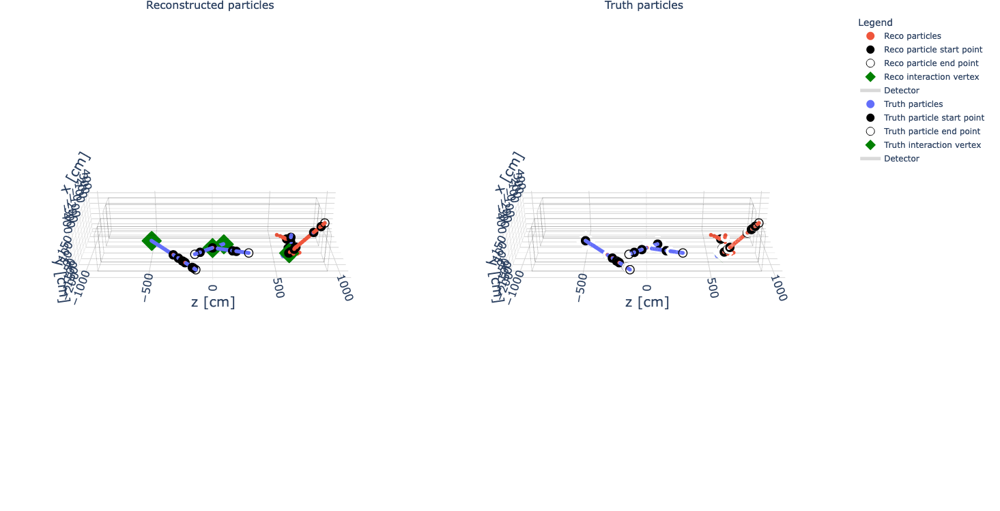

In [68]:
fig.show()

### 1-2: Make a function to compute the length of tracks

The first step in range-based energy reconstruction is to implement a function to compute the length of tracks. In SPINE, this is handled during post-processing:

In [11]:
from spine.post.reco.tracking import CSDAEnergyProcessor

In [12]:
CSDAEnergyProcessor?

Init signature:
CSDAEnergyProcessor(
    tracking_mode='step_next',
    include_pids=[2, 3, 4, 5],
    obj_type='particle',
    run_mode='both',
    truth_point_mode='points',
    **kwargs,
)
Docstring:     
Reconstruct the kinetic energy of tracks based on their range in liquid
argon using the continuous slowing down approximation (CSDA).
Init docstring:
Store the necessary attributes to do CSDA range-based estimation.

Parameters
----------
tracking_mode : str, default 'step_next'
    Method used to compute the track length (one of 'displacement',
    'step', 'step_next', 'bin_pca' or 'spline')
include_pids : list, default [2, 3, 4, 5]
    Particle species to compute the kinetic energy for
**kwargs : dict, optional
    Additional arguments to pass to the tracking algorithm
File:           /sdf/group/neutrino/koh0207/spine/spine/post/reco/tracking.py
Type:           ABCMeta
Subclasses:     

`CSDAEnergyProcessor` is a post-processor that computes the length and range-based kinetic energy (KE) of tracks using the [bethe-bloch formula](https://en.wikipedia.org/wiki/Bethe_formula) mean energy loss per travel distance of charged particles. While the conversion from length to estimated KE is fixed, the processor supports several different methods on computing the track length:
 * `displacement`: Project all track points to its principal axis and compute the length in projected space.
   * Although simple, will not account for curved trajectories, in which case it will underestimate the length.
 * `bin_pca`: Subdivide the track points to segments of some fixed length parameter, compute the *local* principal axis and length estimate, and sum every segment's length to compute the total track range.
   * Has one hyperparameter (segment length), but will allow for better estimates of the track length. 
 * `spline`: Fit a univariate 3D spline that best approximates the 3D coordinates of a given track. Then compute the length by numerical integration of the spine arc length. 
   * Fitting 3D splines and performing numerical integration is generally more computationally expensive than the previous methods. 
   * The class `UnivariateSpline` from `scipy.interpolate` might be useful, if you would like to implement this yourself. 
 * `step/step_next`: Using the start point of a track, serialize (sort) the track's 3D points according to their distance to the start point. Beginning from the track start point with some pre-defined segment length, iteratively progress through the track in the following manner:
    > Initialize $p_{start} = p_0$ (track startpoint), $\mathbf{P}$ (N x 3 3D track coordinates), and $l$ (segment length). Set $L = 0$ (total track length). 
    
    > Do until we cover the whole track:
    >
    >> $\mathbf{P}_i = \{ x \in \mathbf{P} \mid ||x - p_{start}|| \leq l \}$ (select points within distance $l$ from current $p_{start}$).
    >>
    >> if `method` == `step`:
    >>>
    >>> $\displaystyle v_i = \frac{\sum_{x \in \mathbf{P}_i} (x - p_{start})}{|| \sum_{x \in \mathbf{P}_i} x - p_{start} ||}$ (mean direction estimate)
    
    >> else if `method` == `step_next`:
    >>> $\displaystyle p_{next} = \text{argmin}_{x \in \mathbf{P} \setminus \mathbf{P}_i} [ d(x, p_{start}) ]$.
    
    >>> $\displaystyle v_i = \frac{p_{next} - p_{start}}{|| p_{next} - p_{start} ||} $
    
    >> $L = L + l$
    
    >> $p_{start} = p_{start} + (v_i \cdot l)$.
    
   * For actual implementation, you may want to think about how to handle boundary cases (ex. what happens near the end of the track?). 

In [13]:
def compute_track_length(points: np.ndarray, **kwargs):
    """Compute track length by dividing it into segments and computing 
    a local PCA axis, then summing the local lengths of the segments.

    Parameters
    ----------
    points: np.ndarray
        Shape (N, 3)
    bin_size: int, optional
        Size (in voxels) of the segments

    Returns
    -------
    length: float
        The reconstructed length (range) of the track. 
    """
    pass
    # Implement your solution here

In [14]:
# Example Solution
from spine.post.reco.tracking import get_track_length
get_track_length?

Signature:
get_track_length(
    coordinates: array(float32, 2d, A),
    segment_length: float32 = None,
    point: array(float32, 1d, A) = None,
    method: str = 'bin_pca',
    anchor_point: bool = True,
    min_count: int = 10,
    spline_smooth: float = None,
) -> float32
Docstring:
Given a set of point coordinates associated with a track and one of its
end points, compute its length.

Parameters
----------
coordinates : np.ndarray
    (N, 3) Coordinates of the points that make up the track
segment_length : float, optional
    Segment length in the units that specify the coordinates
point : np.ndarray, optional
    (3) An end point of the track
method : str, default 'bin_pca'
    Method used to compute the track length (one of 'displacement', 'step',
    'step_next', 'bin_pca' or 'spline')
anchor_point : bool, default True
    Weather or not to collapse end point onto the closest track point
min_count : int, default 10
    Minimum number of points in a segment to use it to evaluate

Let's first collect all contained tracks. Since we would like to compare truth vs. reco, we will use the already-matched `Reco/TruthParticles`:

In [15]:
# We will use truth->reco matched pairs
truth_tracks, reco_tracks = [], []
for truth_p, reco_p in data['particle_matches_t2r']:
    if truth_p.shape == 1:
        truth_tracks.append(truth_p)
        reco_tracks.append(reco_p)

In [16]:
for truth_p, reco_p in zip(truth_tracks, reco_tracks):
    print(truth_p, " -> ", reco_p, "Contained:", truth_p.is_contained, " Primary: ", truth_p.is_primary, " NumChildren = ", truth_p.children_counts)

TruthParticle(ID: 0   | PID: Muon     | Primary: 1  | Size: 2165  | Match: 18 )  ->  RecoParticle(ID: 18  | PID: Muon     | Primary: 1  | Size: 2150  | Match: 0  ) Contained: 1  Primary:  1  NumChildren =  [0 0 1 0 0]
TruthParticle(ID: 1   | PID: Muon     | Primary: 1  | Size: 1129  | Match: 16 )  ->  RecoParticle(ID: 16  | PID: Muon     | Primary: 1  | Size: 721   | Match: 1  ) Contained: 0  Primary:  1  NumChildren =  [0 0 0 5 0]
TruthParticle(ID: 3   | PID: Muon     | Primary: 1  | Size: 2667  | Match: 19 )  ->  RecoParticle(ID: 19  | PID: Muon     | Primary: 1  | Size: 2668  | Match: 3  ) Contained: 0  Primary:  1  NumChildren =  [0 0 0 2 0]
TruthParticle(ID: 5   | PID: Proton   | Primary: 1  | Size: 163   | Match: 20 )  ->  RecoParticle(ID: 20  | PID: Muon     | Primary: 0  | Size: 162   | Match: 5  ) Contained: 0  Primary:  1  NumChildren =  [0 0 0 0 0]
TruthParticle(ID: 6   | PID: Muon     | Primary: 1  | Size: 440   | Match: 17 )  ->  RecoParticle(ID: 17  | PID: Muon     | Prim

In [17]:
# Collect lengths for all tracks
segment_length = 5.0
method = 'step_next'
truth_lengths, reco_lengths = [], []
for truth_p, reco_p in zip(truth_tracks, reco_tracks):
    truth_l = get_track_length(truth_p.points, segment_length=segment_length, point=truth_p.start_point, method=method)
    reco_l = get_track_length(reco_p.points, segment_length=segment_length, point=reco_p.start_point, method=method)
    truth_lengths.append(truth_l)
    reco_lengths.append(reco_l)

We can quickly check how well the tracks are reconstructed (in length):

Text(0, 0.5, 'RecoParticle Length (cm)')

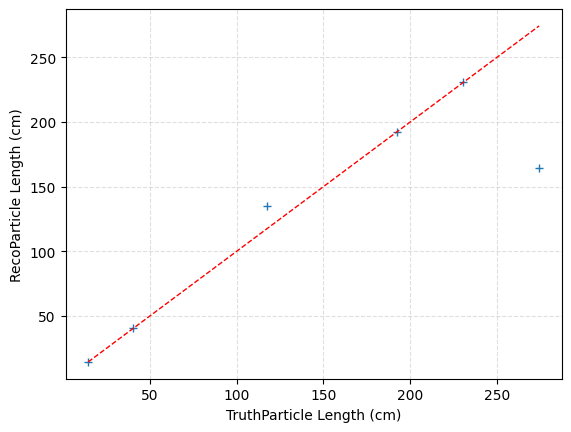

In [18]:
fig, ax = plt.subplots()
ax.errorbar(truth_lengths, reco_lengths, fmt='+')
ax.grid(linestyle='--', alpha=0.4)
x = np.linspace(min(truth_lengths), max(truth_lengths), 10)
ax.errorbar(x, x, fmt='r-', linewidth=1, linestyle='--')
ax.set_xlabel('TruthParticle Length (cm)')
ax.set_ylabel('RecoParticle Length (cm)')

The CSDARange vs. Energy table for [protons](https://physics.nist.gov/PhysRefData/Star/Text/PSTAR.html) and [muons](https://pdg.lbl.gov/2012/AtomicNuclearProperties/MUON_ELOSS_TABLES/muonloss_289.pdf) are stored as `.txt` files under `spine/spine/utils/csda_tables`. To reconstruct the momentum or the kinetic energy using the track length, we are interested in the **CSDARange (g/cm^2)** values vs. **T (Kinetic Energy)**. Note that CSDARange must be divided by the liquid argon density $\rho = 1.396$ g/cm^3 to get the actual integrated length values in cm. 

In [19]:
proton_tab = pd.read_csv(os.path.join(SOFTWARE_DIR, 
    'spine/utils/csda_tables/pE_liquid_argon.txt'), delimiter=' ', index_col=False)
muon_tab   = pd.read_csv(os.path.join(SOFTWARE_DIR, 
    'spine/utils/csda_tables/muE_liquid_argon.txt'), delimiter=' ', index_col=False)
# These are global constants such as argon density, electron mass, etc. 
from spine.utils.globals import LAR_DENSITY, MUON_MASS, PROT_MASS # Liquid Argon Density

Let us construct an interpolating function over the range of available table data points. Again, as a sanity check, we will plot the fitted spline alongside the actual datapoints from the tables. 

In [20]:
from scipy.interpolate import UnivariateSpline, CubicSpline
from functools import partial

In [21]:
# Using Piecewise Linear
# f_muon = partial(np.interp, xp=muon_tab['CSDARange'] / ARGON_DENSITY, fp=muon_tab['T'])
# f_proton = partial(np.interp, xp=proton_tab['CSDARange'] / ARGON_DENSITY, fp=proton_tab['T'])

# Using Splines
f_muon = CubicSpline(muon_tab['CSDARange'] / LAR_DENSITY, muon_tab['T'])
f_proton = CubicSpline(proton_tab['CSDARange'] / LAR_DENSITY, proton_tab['T'])

In [22]:
# Sanity check for visualizing quality of spline fit
x_muon = muon_tab['CSDARange'] / LAR_DENSITY
y_muon = f_muon(x_muon)

x_proton = proton_tab['CSDARange'] / LAR_DENSITY
y_proton = f_proton(x_proton)

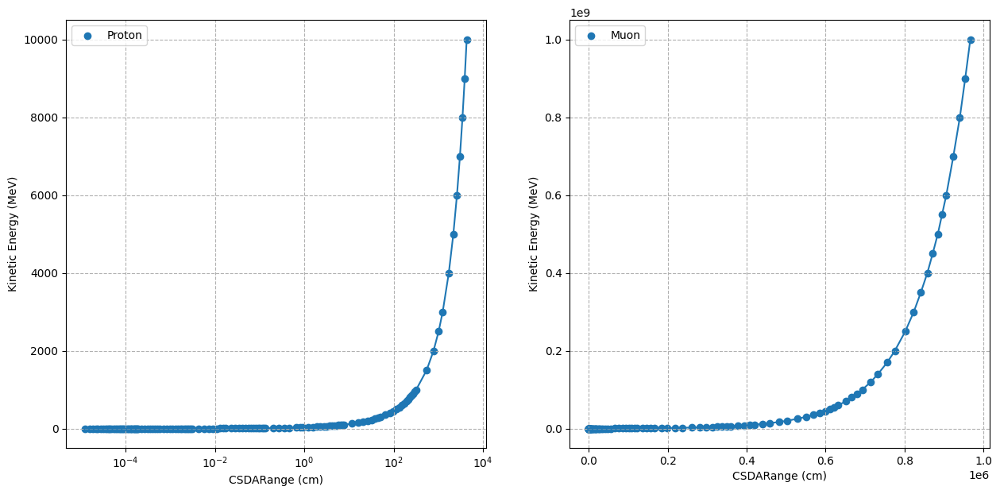

In [23]:
fig, ax = plt.subplots(1, 2, figsize=(15, 7))
ax[0].scatter(proton_tab['CSDARange'] / LAR_DENSITY, proton_tab['T'], label='Proton')
ax[0].plot(x_proton, y_proton)
ax[0].grid(linestyle='--')
ax[0].set_xlabel('CSDARange (cm)')
ax[0].set_ylabel('Kinetic Energy (MeV)')
ax[0].set_xscale('log')
# ax.set_ylim(0, 2000)
ax[0].legend()

ax[1].scatter(muon_tab['CSDARange'] / LAR_DENSITY, muon_tab['T'], label='Muon')
ax[1].plot(x_muon, y_muon)
ax[1].grid(linestyle='--')
ax[1].set_xlabel('CSDARange (cm)')
ax[1].set_ylabel('Kinetic Energy (MeV)')
ax[1].legend()

If the spline interpolation seems reasonable, we can compute the range-based kinetic energy of muons and protons. We will gather 20 events for plotting:

In [78]:
from tqdm import tqdm

# True KE obtained by MC Truth initial energy - particle mass
true_muon_KE, true_proton_KE = [], []
# Reconstructed energy from range-based method
reco_muon_KE, reco_proton_KE = [], []
# Reconstructed energy, but using truth particles
true_computed_muon_KE, true_computed_proton_KE = [], []

log_ids = []

num_entries = 100 # Change to process more event 

for i in tqdm(range(num_entries)):
    data = driver.process(entry=i)
    
    # Retrieving data structures
    reco_particles     = data['reco_particles']
    truth_particles    = data['truth_particles']
    reco_interactions  = data['reco_interactions']
    truth_interactions = data['truth_interactions']
    
    true_tracks, reco_tracks = [], []
    
    for truth_p, reco_p in data['particle_matches_t2r']:
        if truth_p.is_contained and truth_p.shape == 1 and truth_p.is_primary:
            true_tracks.append(truth_p)
            reco_tracks.append(reco_p)
    
    for truth_p, reco_p in zip(true_tracks, reco_tracks):
        
        truth_l = get_track_length(truth_p.points, segment_length=segment_length, point=truth_p.start_point, method=method)
        reco_l = get_track_length(reco_p.points, segment_length=segment_length, point=reco_p.start_point, method=method)

        # Muons must be a contained primary
        
        if truth_p.pid == 2 and (np.linalg.norm(truth_p.ancestor_position - truth_p.position) <= 1e-5):
            # print("    2 = ", truth_p, truth_p.is_contained)
            true_KE = truth_p.energy_init - MUON_MASS
            if (truth_p.energy_deposit / true_KE) > 0.9:
                true_muon_KE.append(true_KE) # Since we're comparing KE
                true_computed_muon_KE.append(float(f_muon(truth_l)))
                reco_KE = float(f_muon(reco_l))
                reco_muon_KE.append(reco_KE)
                log_ids.append((i, truth_p.id, truth_p.pid, (reco_KE - true_KE)))
            
        # Protons must be a contained primary without secondaries
        if truth_p.pid == 4 and truth_p.children_counts.sum() == 0 and truth_p.children_counts[1] == 0:
            # print("    4 = ", truth_p, truth_p.is_contained)
            # p._children_counts is a np.array storing the number of childrens for each semantic class
            # i.e., p._children_counts[0] counts the number of children em showers. 
            true_KE = truth_p.energy_init - PROT_MASS
            if (truth_p.energy_deposit / true_KE) > 0.9:
                reco_KE = float(f_proton(reco_l))
                true_proton_KE.append(true_KE)
                true_computed_proton_KE.append(float(f_proton(truth_l)))
                reco_proton_KE.append(reco_KE)
            
            log_ids.append((i, truth_p.id, truth_p.pid, (reco_KE - true_KE) ))

100%|██████████| 100/100 [00:05<00:00, 17.94it/s]


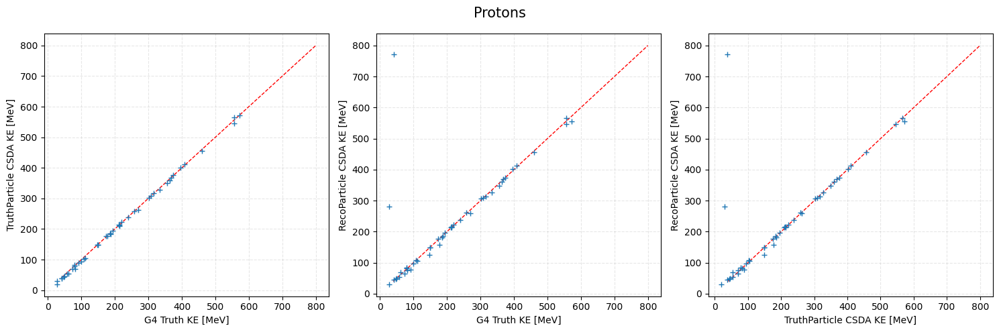

In [79]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
for a in ax:
    a.grid(linestyle='--', alpha=0.3)
    # Draw the y=x line
    x = np.linspace(40, 800, 10)
    a.errorbar(x, x, fmt='r--', linewidth=1)
# Comparing MC Truth KE to Computed KE using Truth Particles
ax[0].errorbar(true_proton_KE, true_computed_proton_KE, fmt='+')
ax[0].set_xlabel('G4 Truth KE [MeV]')
ax[0].set_ylabel('TruthParticle CSDA KE [MeV]')
# Comparing MC Truth KE to Computed KE using Reco Particles
ax[1].errorbar(true_proton_KE, reco_proton_KE, fmt='+')
ax[1].set_xlabel('G4 Truth KE [MeV]')
ax[1].set_ylabel('RecoParticle CSDA KE [MeV]')
# Comparing Computed KE using Reco Particles to Computed KE using Reco Particles
ax[2].errorbar(true_computed_proton_KE, reco_proton_KE, fmt='+')
ax[2].set_xlabel('TruthParticle CSDA KE [MeV]')
ax[2].set_ylabel('RecoParticle CSDA KE [MeV]')

fig.suptitle('Protons', fontsize=15, y=0.98)
fig.tight_layout()

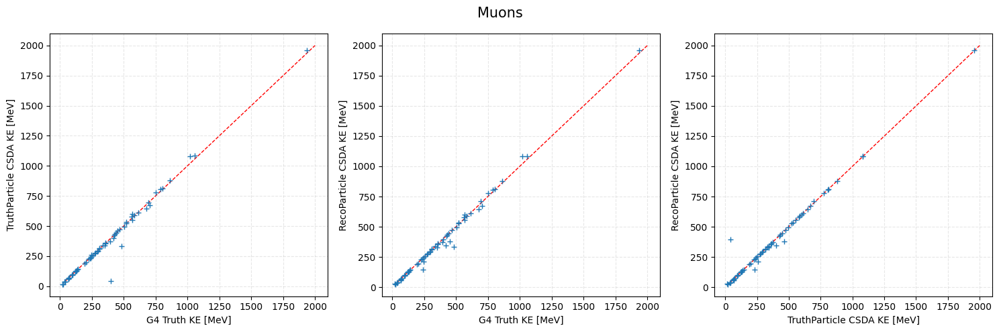

In [80]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
for a in ax:
    a.grid(linestyle='--', alpha=0.3)
    # Draw the y=x line
    x = np.linspace(40, 2000, 10)
    a.errorbar(x, x, fmt='r--', linewidth=1)
# Comparing MC Truth KE to Computed KE using Truth Particles
ax[0].errorbar(true_muon_KE, true_computed_muon_KE, fmt='+')
ax[0].set_xlabel('G4 Truth KE [MeV]')
ax[0].set_ylabel('TruthParticle CSDA KE [MeV]')
# Comparing MC Truth KE to Computed KE using Reco Particles
ax[1].errorbar(true_muon_KE, reco_muon_KE, fmt='+')
ax[1].set_xlabel('G4 Truth KE [MeV]')
ax[1].set_ylabel('RecoParticle CSDA KE [MeV]')
# Comparing Computed KE using Reco Particles to Computed KE using Reco Particles
ax[2].errorbar(true_computed_muon_KE, reco_muon_KE, fmt='+')
ax[2].set_xlabel('TruthParticle CSDA KE [MeV]')
ax[2].set_ylabel('RecoParticle CSDA KE [MeV]')

fig.suptitle('Muons', fontsize=15, y=0.98)
fig.tight_layout()